# Plot HLA atlas figure

Joyce Kang

July 2023

In [1]:
suppressPackageStartupMessages({
    library(tidyr)
    library(dplyr)
    library(plyr)
    library(Matrix)
    library(Matrix.utils)
    library(singlecellmethods)
    library(irlba)
    library(symphony)
    library(ggplot2)
    library(corrplot)
    library(pheatmap)
    library(viridis)
    library(ggrastr)
    library(RColorBrewer)
    library(dplyr)
    library(purrr)
    library(ggplot2)
    library(cowplot)
    library(ggpubr)
    library(lme4)
    library(ggrepel)
    require(MuMIn)
    library(patchwork)
})

source('../scripts/utils.R')

# Plot HLA genes on UMAP

Plot as all 8 genes separately

In [3]:
plot_eight_genes = function(reference, save, cell_type = 'Myeloid', h = 9.5, w = 8) {
    meta_data = cbind(reference$meta_data, as.matrix(t(reference$exp_norm_HLA)))
    meta_data$dataset = revalue(meta_data$dataset, old_new_dataset_names)
    meta_data$dataset = factor(meta_data$dataset, levels = c('Synovium', 'Intestine', 'PBMC-cultured', 'PBMC-blood'))
    
    data = cbind(meta_data, reference$umap$embedding)
    long = gather(data, gene, logCP10k, `HLA-A`:`HLA-DQB1`, factor_key=TRUE)
    long$gene = factor(long$gene, levels = c('HLA-A','HLA-B','HLA-C','HLA-DPA1','HLA-DPB1','HLA-DQA1','HLA-DQB1','HLA-DRB1'))
    
    fig.size(h, w)
    pdf(save, height=h, width=w, useDingbats = FALSE)
    
    # Find the 99th percentile
    max_cutoff = quantile(long$logCP10k, 0.99)
    p = long %>%
            dplyr::sample_frac(1L) %>% # permute rows randomly
            ggplot(aes(x = UMAP1, y = UMAP2)) + 
            geom_point_rast(aes(col = logCP10k), size = 0.3, stroke = 0.2, shape = 16) + 
            theme_classic() + 
            theme(plot.title = element_text(hjust = 0.5)) +
            theme(legend.position='right') + 
            scale_color_gradientn(colours = c("mediumpurple4", "maroon", "orange", "lightgoldenrod1"), 
                              values = c(0, 0.33, 0.66, 1), 
                              limits=c(0, max_cutoff), na.value = "lightgoldenrod1") +
            theme(legend.text = element_text(size=14), legend.title=element_text(size=14)) + 
            facet_grid(gene ~ dataset) +
            ggtitle(paste0('HLA expression in ', cell_type, ' cells (n=', format(nrow(reference$meta_data), 
                            big.mark = ",", scientific = FALSE), ' cells)')) + 
            labs(col = 'Normalized\nexpression') + theme(strip.text = element_text(size = 13))
    print(p)
    dev.off()
    return(p)   
}

plot_eight_genes_hex = function(reference, save, cell_type = 'Myeloid', h = 9.5, w = 8) {
    meta_data = cbind(reference$meta_data, as.matrix(t(reference$exp_norm_HLA)))
    meta_data$dataset = revalue(meta_data$dataset, old_new_dataset_names)
    meta_data$dataset = factor(meta_data$dataset, levels = c('Synovium', 'Intestine', 'PBMC-cultured', 'PBMC-blood'))
    data = cbind(meta_data, reference$umap$embedding)
    long = gather(data, gene, logCP10k, `HLA-A`:`HLA-DQB1`, factor_key=TRUE)
    long$gene = factor(long$gene, levels = c('HLA-A','HLA-B','HLA-C','HLA-DPA1','HLA-DPB1','HLA-DQA1','HLA-DQB1','HLA-DRB1'))
    
    fig.size(h, w)
    pdf(save, height=h, width=w, useDingbats = FALSE)
    
    # Find the 99th percentile
    max_cutoff = quantile(long$logCP10k, 0.99)
    p = long %>%
            dplyr::sample_frac(1L) %>% # permute rows randomly
            ggplot(aes(x = UMAP1, y = UMAP2, z = logCP10k)) +
            #geom_point_rast(aes(x = UMAP1, y = UMAP2, col = gene_exp_norm), alpha = 0.5, size = 0.05) +
            stat_summary_hex(bins = 50) + 
            scale_fill_gradientn(colours = c("mediumpurple4", "maroon", "orange", "lightgoldenrod1"), 
                              values = c(0, 0.33, 0.66, 1), 
                              limits=c(0, max_cutoff), na.value = "lightgoldenrod1") +
            theme_classic() + theme(plot.title = element_text(hjust = 0.5)) +
            theme(legend.text = element_text(size=14), legend.title=element_text(size=14)) + 
            facet_grid(gene ~ dataset) +
            ggtitle(paste0('HLA expression in ', cell_type, ' cells (n=', format(nrow(reference$meta_data), 
                            big.mark = ",", scientific = FALSE), ' cells)')) + 
            labs(fill = 'Normalized\nexpression') + theme(strip.text = element_text(size = 13))
    print(p)
    dev.off()
    return(p)   
}

Plot as class I and II

In [4]:
plot_byclass = function(reference, save, h = 3.5, w = 10) {
    reference$meta_data$dataset = revalue(reference$meta_data$dataset, old_new_dataset_names)
    reference$meta_data$dataset = factor(reference$meta_data$dataset, 
                                         levels = c('Synovium', 'Intestine', 'PBMC-cultured', 'PBMC-blood'))
    
    # Add log(CP10k+1) HLA expression to metadata
    data = cbind(reference$meta_data, reference$umap$embedding, as.matrix(t(reference$exp_norm_HLA)))
    data = data %>% mutate(`HLA class I` = (`HLA-A` + `HLA-B` + `HLA-C`) / 3)
    data = data %>% mutate(`HLA class II` = (`HLA-DRB1` + `HLA-DQA1` + `HLA-DQB1` + `HLA-DPA1` + `HLA-DPB1`) / 5)
    long = gather(data, class, logCP10k, `HLA class I`:`HLA class II`, factor_key=TRUE)
    
    fig.size(h, w)
    pdf(save, height=h, width=w, useDingbats = FALSE)
        p = long %>% 
      group_split(class) %>% 
      map(
            ~ ggplot(., aes(UMAP1, UMAP2, color = logCP10k)) + 
              geom_point_rast(size = 0.3, stroke = 0.2, shape = 16) + 
              scale_color_gradientn(colours = c("mediumpurple4", "maroon", "orange", "lightgoldenrod1"), 
                              values = c(0, 0.33, 0.66, 1), 
                              limits=c(0, quantile(.$logCP10k, 0.99)), na.value = "lightgoldenrod1") +
              facet_grid(class~dataset, labeller = function(x) label_value(x, multi_line = FALSE)) +
              theme(legend.text = element_text(size=14), legend.title=element_text(size=14))+
              theme_void() + labs(col = 'Mean normalized\nexpression') + 
              theme(strip.background = element_blank(), strip.text = element_blank())
      ) %>% 
      plot_grid(plotlist = ., align = 'hv', ncol = 1)
    print(p)
    dev.off()
    p
}
          
plot_byclass_hex = function(reference, save, h = 3.5, w = 10) {
    # Add log(CP10k+1) HLA expression to metadata
    data = cbind(reference$meta_data, reference$umap$embedding, as.matrix(t(reference$exp_norm_HLA)))
    data = data %>% mutate(`HLA class I` = (`HLA-A` + `HLA-B` + `HLA-C`) / 3)
    data = data %>% mutate(`HLA class II` = (`HLA-DRB1` + `HLA-DQA1` + `HLA-DQB1` + `HLA-DPA1` + `HLA-DPB1`) / 5)
    long = gather(data, class, logCP10k, `HLA class I`:`HLA class II`, factor_key=TRUE)
    
    fig.size(h, w)
    pdf(save, height=h, width=w, useDingbats = FALSE)
        p = long %>% 
          group_split(class) %>% 
          map( ~ ggplot(., aes(x = UMAP1, y = UMAP2, z = logCP10k)) +
              stat_summary_hex(bins = 50) + 
              scale_fill_gradientn(colours = c("mediumpurple4", "maroon", "orange", "lightgoldenrod1"), 
                              values = c(0, 0.33, 0.66, 1), 
                              limits=c(0, quantile(.$logCP10k, 0.99)), na.value = "lightgoldenrod1") +
              facet_grid(class~dataset, labeller = function(x) label_value(x, multi_line = FALSE)) +
              theme(legend.text = element_text(size=14), legend.title=element_text(size=14))+
              theme_void() + labs(fill = 'Mean normalized\nexpression') + 
              theme(strip.background = element_blank(), strip.text = element_blank())
          ) %>% 
          plot_grid(plotlist = ., align = 'hv', ncol = 1)
    print(p)
    dev.off()
    p
}

## Myeloid: All Cohorts

In [5]:
reference = readRDS('../symphony/AllCohorts_Myeloid_sample0.5batch0.5dataset0.5_reference.rds')
dim(reference$meta_data)
reference$meta_data$dataset_cell_type_fine = paste0(reference$meta_data$dataset, '_', reference$meta_data$cell_type_fine)
unique(reference$meta_data$dataset_cell_type_fine)
# Group Randolph datasets together for faceting
reference$meta_data = reference$meta_data %>% mutate(dataset = 
                                        ifelse(dataset %in% c('Randolph'), 'Randolph2021', dataset))
reference$meta_data$dataset = factor(reference$meta_data$dataset, 
                                     levels = c('AMP2RA', 'Smillie2019', 'Randolph2021', 'OneK1K')) # reorder factor levels
table(reference$meta_data$dataset)

[1] 145090      9

[1] "AMP2RA_M-10: DC2"                   "AMP2RA_M-0: MERTK+ SELENOP+ LYVE1+"
 [3] "AMP2RA_M-7: IL1B+ FCN1+"            "AMP2RA_M-9: DC3"                   
 [5] "AMP2RA_M-5: C1QA+"                  "AMP2RA_M-1: MERTK+ SELENOP+ LYVE1-"
 [7] "AMP2RA_M-2: MERTK+ S100A8+"         "AMP2RA_M-6: STAT1+ CXCL10+"        
 [9] "AMP2RA_M-4: SPP1+"                  "AMP2RA_M-13: pDC"                  
[11] "AMP2RA_M-14: LAMP3+"                "AMP2RA_M-8: PLCG2+"                
[13] "AMP2RA_M-3: MERTK+ HBEGF+"          "AMP2RA_M-12: DC1"                  
[15] "AMP2RA_M-11: DC4"                   "OneK1K_CD16 Mono"                  
[17] "OneK1K_CD14 Mono"                   "OneK1K_cDC2"                       
[19] "OneK1K_pDC"                         "OneK1K_ASDC"                       
[21] "OneK1K_cDC1"                        "Randolph_monocytes"                
[23] "Randolph_highly_infected"           "Randolph_DC"                       
[25] "Randolph_infected_monocytes"        "Smillie2019_Macrophages"           
[27] "Smillie2019_DC2"                    "Smillie2019_Cycling Monocytes"     
[29] "Smillie2019_Inflammatory Monocytes" "Smillie2019_DC1"


      AMP2RA  Smillie2019 Randolph2021       OneK1K 
       66789        14492        23241        40568 

Plot OneK1K and AMP2RA cells as a legend

In [7]:
data_subset = cbind(reference$meta_data, reference$umap$embedding, t(reference$Z_corr), t(reference$Z_orig)) %>%
            filter(dataset %in% c('OneK1K', 'AMP2RA'))
data_subset$dataset_cell_type_fine %>% unique()
data_subset$dataset_cell_type_fine = revalue(data_subset$dataset_cell_type_fine, 
                                             old_new_Myeloid)

[1] "AMP2RA_M-10: DC2"                   "AMP2RA_M-0: MERTK+ SELENOP+ LYVE1+"
 [3] "AMP2RA_M-7: IL1B+ FCN1+"            "AMP2RA_M-9: DC3"                   
 [5] "AMP2RA_M-5: C1QA+"                  "AMP2RA_M-1: MERTK+ SELENOP+ LYVE1-"
 [7] "AMP2RA_M-2: MERTK+ S100A8+"         "AMP2RA_M-6: STAT1+ CXCL10+"        
 [9] "AMP2RA_M-4: SPP1+"                  "AMP2RA_M-13: pDC"                  
[11] "AMP2RA_M-14: LAMP3+"                "AMP2RA_M-8: PLCG2+"                
[13] "AMP2RA_M-3: MERTK+ HBEGF+"          "AMP2RA_M-12: DC1"                  
[15] "AMP2RA_M-11: DC4"                   "OneK1K_CD16 Mono"                  
[17] "OneK1K_CD14 Mono"                   "OneK1K_cDC2"                       
[19] "OneK1K_pDC"                         "OneK1K_ASDC"                       
[21] "OneK1K_cDC1"

The following `from` values were not present in `x`: Smillie, Randolph_NI, Randolph



png 
  2

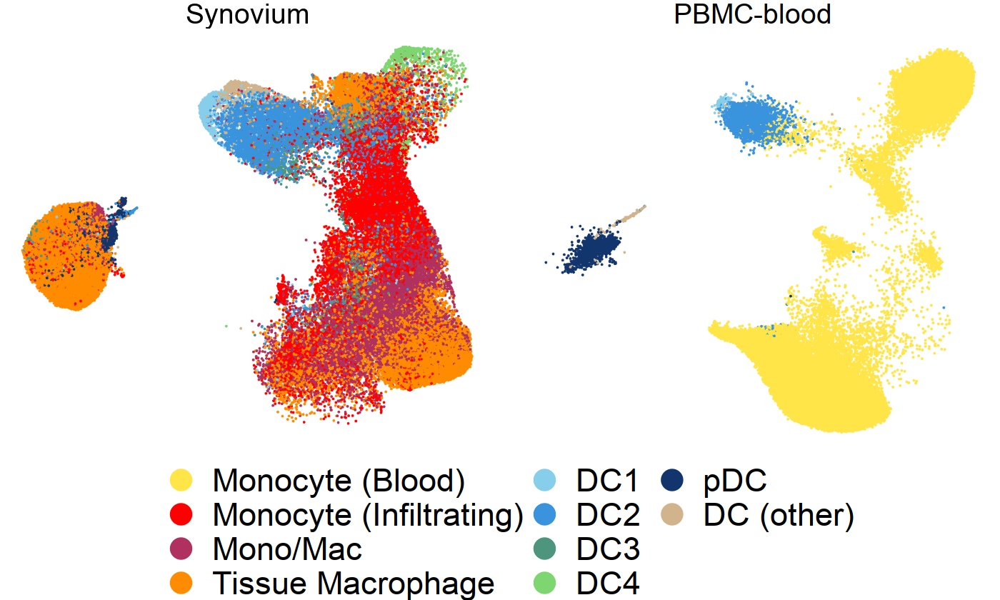

In [8]:
fig.size(4.2, 7)
pdf('../SuppFigs/Atlas_HLA_annot_Myeloid_UMAP_legend_bottom.pdf', height=4.2, width=7, useDingbats = FALSE)
data_subset$dataset = revalue(data_subset$dataset, old_new_dataset_names)
data_subset$dataset = factor(data_subset$dataset, levels = c('Synovium', 'Intestine', 'PBMC-cultured', 'PBMC-blood'))
p = data_subset %>%
            dplyr::sample_frac(1L) %>% # permute rows randomly
            ggplot(aes(x = UMAP1, y = UMAP2)) + 
            geom_point_rast(aes(col = dataset_cell_type_fine), size = 0.4, stroke = 0.2, shape = 16) + 
            theme_void() + 
            theme(plot.title = element_text(hjust = 0.5)) +
            theme(legend.position='bottom') +
            theme(legend.text = element_text(size=16), legend.title=element_text(size=14)) + 
            guides(colour = guide_legend(override.aes = list(size = 5), ncol = 3)) + labs(col = '') +
            scale_color_manual(values = Myeloid_colors) + facet_wrap(~dataset) +
            theme(strip.text.x = element_text(size = 14))
print(p)
dev.off()
p

## Myeloid: Map onto tissue states

In [10]:
ref_query = readRDS('../symphony/RefQuery_Myeloid_mapBloodOntoTissue.rds')

The following `from` values were not present in `x`: Smillie, Randolph_NI, Randolph



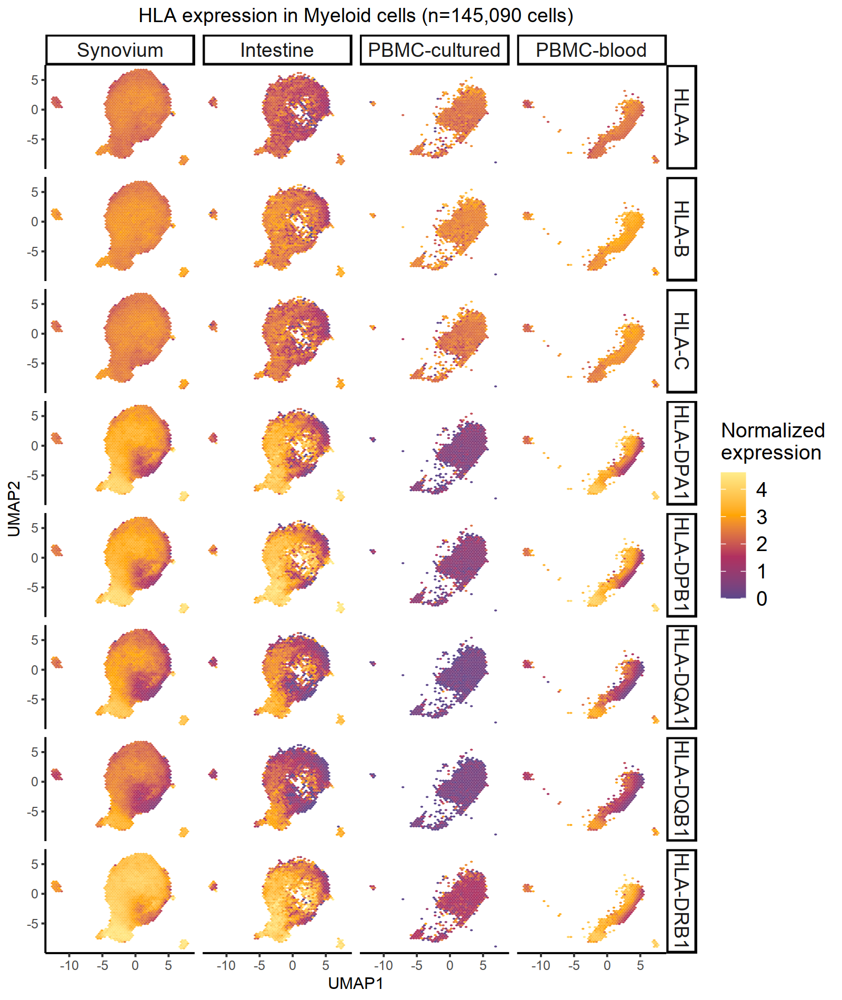

In [11]:
plot_eight_genes_hex(ref_query, '../SuppFigs/Atlas_HLA_expression_Myeloid_mapOntoTissue_UMAP_hex.pdf')

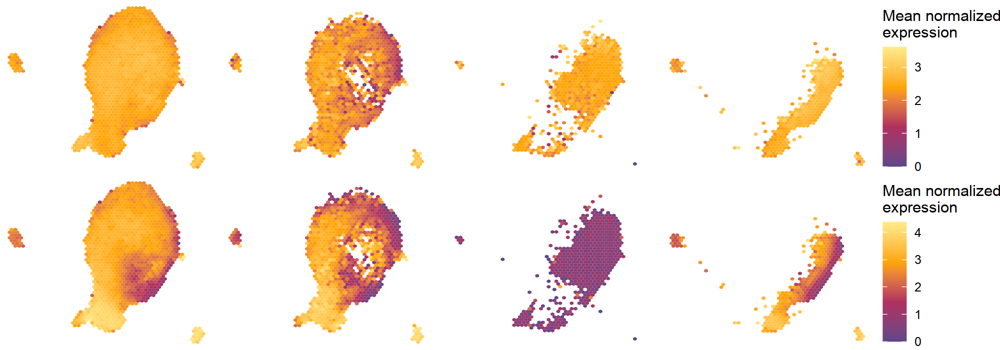

In [12]:
plot_byclass_hex(ref_query, 'Atlas_HLA_class_exp_Myeloid_mapOntoTissue_UMAP_hex.pdf')

Plot OneK1K and AMP2RA cells as a legend

In [13]:
data_subset = cbind(ref_query$meta_data, ref_query$umap$embedding) %>%
            filter(dataset %in% c('OneK1K', 'AMP2RA'))
data_subset$dataset_cell_type_fine %>% unique()

[1] "AMP2RA_M-10: DC2"                   "AMP2RA_M-0: MERTK+ SELENOP+ LYVE1+"
 [3] "AMP2RA_M-7: IL1B+ FCN1+"            "AMP2RA_M-9: DC3"                   
 [5] "AMP2RA_M-5: C1QA+"                  "AMP2RA_M-1: MERTK+ SELENOP+ LYVE1-"
 [7] "AMP2RA_M-2: MERTK+ S100A8+"         "AMP2RA_M-6: STAT1+ CXCL10+"        
 [9] "AMP2RA_M-4: SPP1+"                  "AMP2RA_M-13: pDC"                  
[11] "AMP2RA_M-14: LAMP3+"                "AMP2RA_M-8: PLCG2+"                
[13] "AMP2RA_M-3: MERTK+ HBEGF+"          "AMP2RA_M-12: DC1"                  
[15] "AMP2RA_M-11: DC4"                   "OneK1K_CD16 Mono"                  
[17] "OneK1K_CD14 Mono"                   "OneK1K_cDC2"                       
[19] "OneK1K_pDC"                         "OneK1K_ASDC"                       
[21] "OneK1K_cDC1"

In [14]:
data_subset$dataset_cell_type_fine = revalue(data_subset$dataset_cell_type_fine, 
                                             old_new_Myeloid)

The following `from` values were not present in `x`: Smillie, Randolph_NI, Randolph



png 
  2

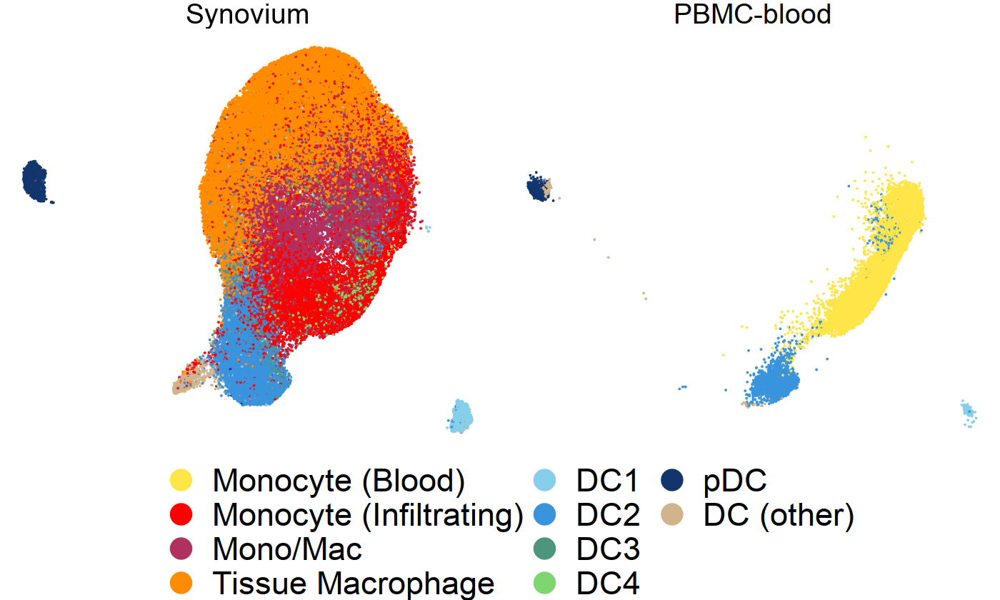

In [15]:
fig.size(4.2, 7)
pdf('Atlas_HLA_annot_Myeloid_mapOntoTissue_UMAP_legend_bottom.pdf', height=4.2, width=7, useDingbats = FALSE)
data_subset$dataset = revalue(data_subset$dataset, old_new_dataset_names)
data_subset$dataset = factor(data_subset$dataset, levels = c('Synovium', 'Intestine', 'PBMC-cultured', 'PBMC-blood'))
p = data_subset %>%
            dplyr::sample_frac(1L) %>% # permute rows randomly
            ggplot(aes(x = UMAP1, y = UMAP2)) + 
            geom_point_rast(aes(col = dataset_cell_type_fine), size = 0.4, stroke = 0.2, shape = 16) + 
            theme_void() + 
            theme(plot.title = element_text(hjust = 0.5)) +
            theme(legend.position='bottom') +
            theme(legend.text = element_text(size=16), legend.title=element_text(size=14)) + 
            guides(colour = guide_legend(override.aes = list(size = 5), ncol = 3)) + labs(col = '') +
            scale_color_manual(values = Myeloid_colors) + facet_wrap(~dataset) +
            theme(strip.text.x = element_text(size = 14))
print(p)
dev.off()
p

## B: All Cohorts

In [16]:
reference = readRDS('../symphony/AllCohorts_B_plasma_sample0.5batch0.5dataset0.5_reference.rds')
dim(reference$meta_data)
reference$meta_data$dataset_cell_type_fine = paste0(reference$meta_data$dataset, '_', reference$meta_data$cell_type_fine)
unique(reference$meta_data$dataset_cell_type_fine)
# Group Randolph datasets together for faceting
reference$meta_data = reference$meta_data %>% mutate(dataset = 
                                        ifelse(dataset %in% c('Randolph'), 'Randolph2021', dataset))
reference$meta_data$dataset = factor(reference$meta_data$dataset, 
                                     levels = c('AMP2RA', 'Smillie2019', 'Randolph2021', 'OneK1K')) # reorder factor levels
table(reference$meta_data$dataset)

[1] 180935      9

[1] "AMP2RA_B-2: IgM+IgD+TCL1A+ naive"             
 [2] "AMP2RA_B-1: CD24++CD27+IgM+ unswitched memory"
 [3] "AMP2RA_B-0: CD24+CD27+CD11b+ switched memory" 
 [4] "AMP2RA_B-8: IgG1+IgG3+ plasma"                
 [5] "AMP2RA_B-7: HLA-DR+IgG+ plasmablast"          
 [6] "AMP2RA_B-3: IgM+IgD+CD1c+ MZ-like"            
 [7] "AMP2RA_B-5: CD11c+LAMP1+ ABC"                 
 [8] "AMP2RA_B-6: IgM+ plasma"                      
 [9] "AMP2RA_B-4: AICDA+BCL6+ GC-like"              
[10] "OneK1K_B naive"                               
[11] "OneK1K_B memory"                              
[12] "OneK1K_B intermediate"                        
[13] "OneK1K_Plasmablast"                           
[14] "Randolph_B"                                   
[15] "Smillie2019_Plasma"                           
[16] "Smillie2019_Cycling B"                        
[17] "Smillie2019_Follicular"                       
[18] "Smillie2019_GC"


      AMP2RA  Smillie2019 Randolph2021       OneK1K 
       25917        56572        17662        80784 

Plot OneK1K and AMP2RA cells as a legend

In [17]:
data_subset = cbind(reference$meta_data, reference$umap$embedding) %>%
            filter(dataset %in% c('OneK1K', 'AMP2RA'))
data_subset$dataset_cell_type_fine %>% unique()

[1] "AMP2RA_B-2: IgM+IgD+TCL1A+ naive"             
 [2] "AMP2RA_B-1: CD24++CD27+IgM+ unswitched memory"
 [3] "AMP2RA_B-0: CD24+CD27+CD11b+ switched memory" 
 [4] "AMP2RA_B-8: IgG1+IgG3+ plasma"                
 [5] "AMP2RA_B-7: HLA-DR+IgG+ plasmablast"          
 [6] "AMP2RA_B-3: IgM+IgD+CD1c+ MZ-like"            
 [7] "AMP2RA_B-5: CD11c+LAMP1+ ABC"                 
 [8] "AMP2RA_B-6: IgM+ plasma"                      
 [9] "AMP2RA_B-4: AICDA+BCL6+ GC-like"              
[10] "OneK1K_B naive"                               
[11] "OneK1K_B memory"                              
[12] "OneK1K_B intermediate"                        
[13] "OneK1K_Plasmablast"

In [18]:
data_subset$dataset_cell_type_fine = revalue(data_subset$dataset_cell_type_fine, 
                                             old_new_B_plasma)

The following `from` values were not present in `x`: Smillie, Randolph_NI, Randolph



png 
  2

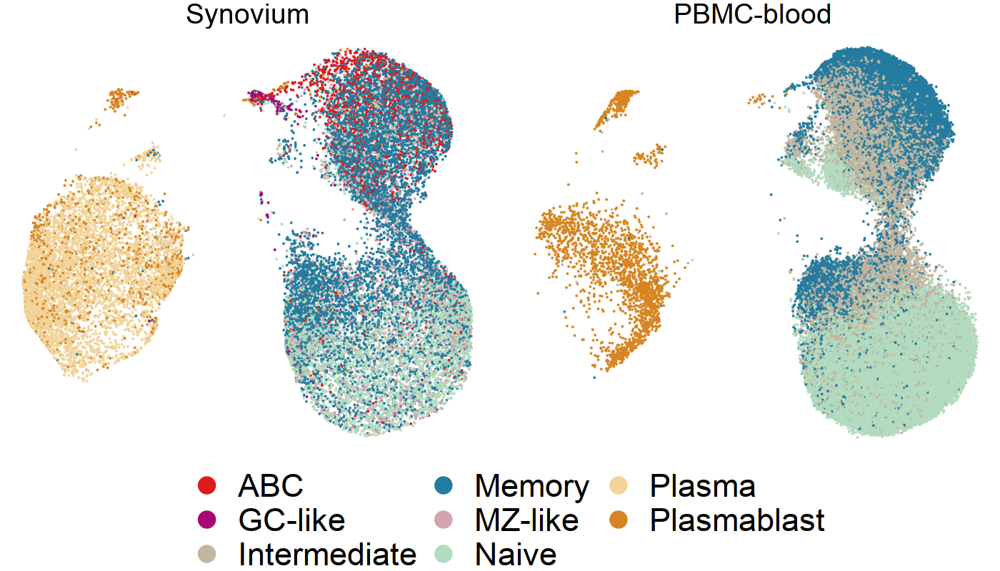

In [19]:
fig.size(4, 7)
pdf('../SuppFigs/Atlas_HLA_annot_B_plasma_UMAP_legend_bottom.pdf', height=4, width=7, useDingbats = FALSE)
data_subset$dataset = revalue(data_subset$dataset, old_new_dataset_names)
data_subset$dataset = factor(data_subset$dataset, levels = c('Synovium', 'Intestine', 'PBMC-cultured', 'PBMC-blood'))
p = data_subset %>%
            dplyr::sample_frac(1L) %>% # permute rows randomly
            ggplot(aes(x = UMAP1, y = UMAP2)) + 
            geom_point_rast(aes(col = dataset_cell_type_fine), size = 0.4, stroke = 0.2, shape = 16) + 
            theme_void() + 
            theme(plot.title = element_text(hjust = 0.5)) +
            theme(legend.position='bottom') +
            theme(legend.text = element_text(size=16), legend.title=element_text(size=14)) + 
            guides(colour = guide_legend(override.aes = list(size = 4), ncol = 3)) + labs(col = '') +
            scale_color_manual(values = B_plasma_colors) + facet_wrap(~dataset) +
            theme(strip.text.x = element_text(size = 14))
print(p)
dev.off()
p

## B: Map onto tissue states

The UMAP looks a little messy - will try Symphony mapping instead

In [21]:
ref_query = readRDS('../symphony/RefQuery_B_plasma_mapBloodOntoTissue.rds')

The following `from` values were not present in `x`: Smillie, Randolph_NI, Randolph



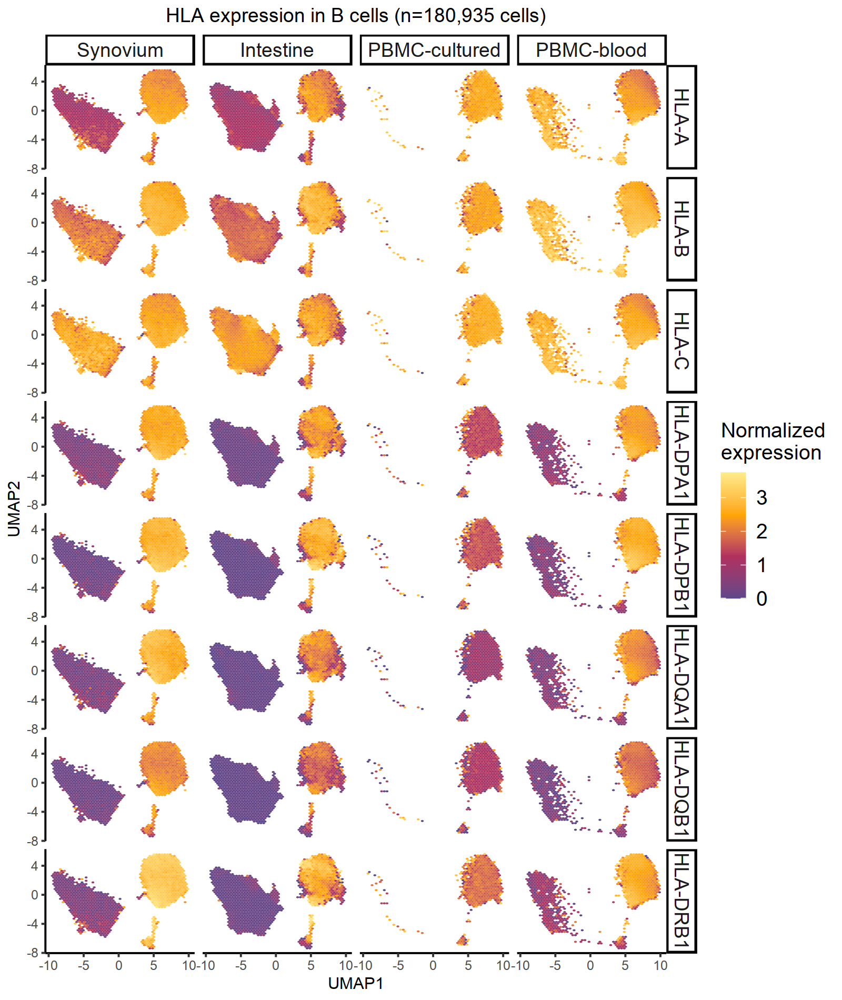

In [22]:
plot_eight_genes_hex(ref_query, '../SuppFigs/Atlas_HLA_expression_B_plasma_mapOntoTissue_UMAP_hex.pdf', cell_type = 'B')

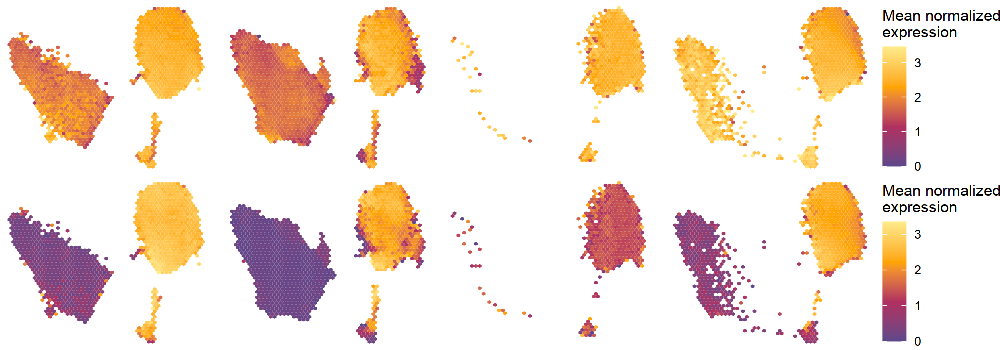

In [23]:
plot_byclass_hex(ref_query, 'Atlas_HLA_class_exp_B_plasma_mapOntoTissue_UMAP_hex.pdf')

Plot OneK1K and AMP2RA cells as a legend

In [24]:
data_subset = cbind(ref_query$meta_data, ref_query$umap$embedding) %>%
            filter(dataset %in% c('OneK1K', 'AMP2RA'))
data_subset$dataset_cell_type_fine %>% unique()

[1] "AMP2RA_B-2: IgM+IgD+TCL1A+ naive"             
 [2] "AMP2RA_B-1: CD24++CD27+IgM+ unswitched memory"
 [3] "AMP2RA_B-0: CD24+CD27+CD11b+ switched memory" 
 [4] "AMP2RA_B-8: IgG1+IgG3+ plasma"                
 [5] "AMP2RA_B-7: HLA-DR+IgG+ plasmablast"          
 [6] "AMP2RA_B-3: IgM+IgD+CD1c+ MZ-like"            
 [7] "AMP2RA_B-5: CD11c+LAMP1+ ABC"                 
 [8] "AMP2RA_B-6: IgM+ plasma"                      
 [9] "AMP2RA_B-4: AICDA+BCL6+ GC-like"              
[10] "OneK1K_B naive"                               
[11] "OneK1K_B memory"                              
[12] "OneK1K_B intermediate"                        
[13] "OneK1K_Plasmablast"

In [25]:
data_subset$dataset_cell_type_fine = revalue(data_subset$dataset_cell_type_fine, 
                                             old_new_B_plasma)

The following `from` values were not present in `x`: Smillie, Randolph_NI, Randolph



png 
  2

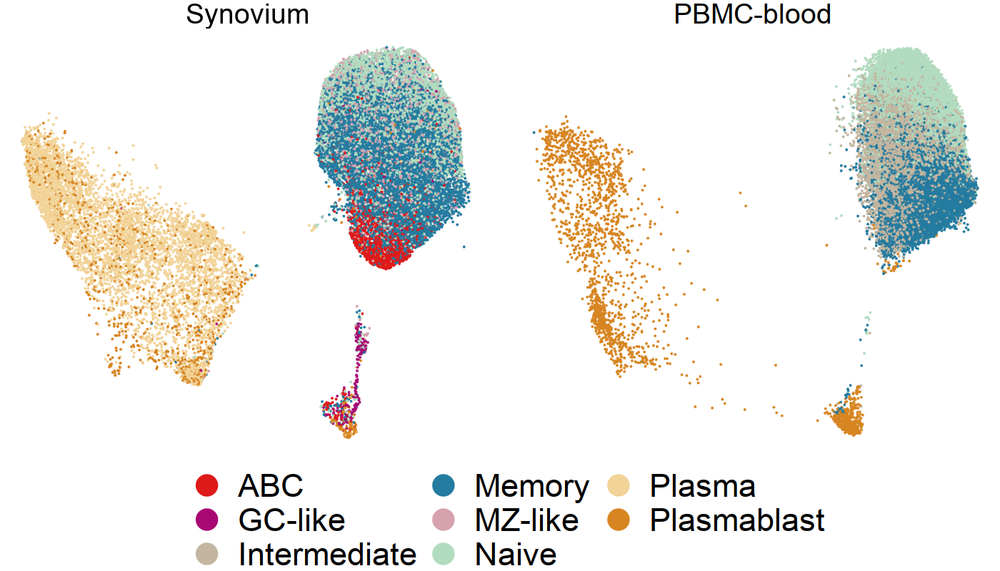

In [26]:
fig.size(4, 7)
pdf('Atlas_HLA_annot_B_plasma_mapOntoTissue_UMAP_legend_bottom.pdf', height=4, width=7, useDingbats = FALSE)
data_subset$dataset = revalue(data_subset$dataset, old_new_dataset_names)
data_subset$dataset = factor(data_subset$dataset, levels = c('Synovium', 'Intestine', 'PBMC-cultured', 'PBMC-blood'))
p = data_subset %>%
            dplyr::sample_frac(1L) %>% # permute rows randomly
            ggplot(aes(x = UMAP1, y = UMAP2)) + 
            geom_point_rast(aes(col = dataset_cell_type_fine), size = 0.4, stroke = 0.2, shape = 16) + 
            theme_void() + 
            theme(plot.title = element_text(hjust = 0.5)) +
            theme(legend.position='bottom') +
            theme(legend.text = element_text(size=16), legend.title=element_text(size=14)) + 
            guides(colour = guide_legend(override.aes = list(size = 5), ncol = 3)) + labs(col = '') +
            scale_color_manual(values = B_plasma_colors) + facet_wrap(~dataset) +
            theme(strip.text.x = element_text(size = 14))
print(p)
dev.off()
p

## T: All Cohorts

In [27]:
reference = readRDS('../symphony/AllCohorts_T_sample0.5batch0.5dataset0.5_reference.rds')
dim(reference$meta_data)
reference$meta_data$dataset_cell_type_fine = paste0(reference$meta_data$dataset, '_', reference$meta_data$cell_type_fine)
unique(reference$meta_data$dataset_cell_type_fine)
# Group Randolph datasets together for faceting
reference$meta_data = reference$meta_data %>% mutate(dataset = 
                                        ifelse(dataset %in% c('Randolph'), 'Randolph2021', dataset))
reference$meta_data$dataset = factor(reference$meta_data$dataset, 
                                     levels = c('AMP2RA', 'Smillie2019', 'Randolph2021', 'OneK1K')) # reorder factor levels
table(reference$meta_data$dataset)

[1] 805389      9

[1] "AMP2RA_T-6: CD4+ memory"             "AMP2RA_T-5: CD4+ GZMK+ memory"      
 [3] "AMP2RA_T-8: CD4+ CD25-high Treg"     "AMP2RA_T-22: Vdelta1"               
 [5] "AMP2RA_T-14: CD8+ GZMK+ memory"      "AMP2RA_T-2: CD4+ IL7R+CCR5+ memory" 
 [7] "AMP2RA_T-12: CD4+ GNLY+"             "AMP2RA_T-4: CD4+ naive"             
 [9] "AMP2RA_T-0: CD4+ IL7R+ memory"       "AMP2RA_T-3: CD4+ Tfh/Tph"           
[11] "AMP2RA_T-1: CD4+ CD161+ memory"      "AMP2RA_T-16: CD8+ CD45ROlow/naive"  
[13] "AMP2RA_T-18: Proliferating"          "AMP2RA_T-20: CD38+"                 
[15] "AMP2RA_T-13: CD8+ GZMK/B+ memory"    "AMP2RA_T-19: MT-high (low quality)" 
[17] "AMP2RA_T-10: CD4+ OX40+NR3C1+"       "AMP2RA_T-9: CD4+ CD25-low Treg"     
[19] "AMP2RA_T-15: CD8+ GZMB+/TEMRA"       "AMP2RA_T-11: CD4+ CD146+ memory"    
[21] "AMP2RA_T-7: CD4+ Tph"                "AMP2RA_T-23: Vdelta2"               
[23] "AMP2RA_T-17: CD8+ activated/NK-like" "OneK1K_CD4 TCM"                     
[25] "OneK1K_CD4 Naive"                    "OneK1K_CD8 TEM"                     
[27] "OneK1K_CD8 TCM"                      "OneK1K_CD4 TEM"                     
[29] "OneK1K_Treg"                         "OneK1K_gdT"                         
[31] "OneK1K_CD8 Naive"                    "OneK1K_dnT"                         
[33] "OneK1K_CD4 CTL"                      "OneK1K_CD4 Proliferating"           
[35] "OneK1K_CD8 Proliferating"            "Randolph_CD4_T"                     
[37] "Randolph_CD8_T"                      "Smillie2019_CD8+ IELs"              
[39] "Smillie2019_Tregs"                   "Smillie2019_Cycling T"              
[41] "Smillie2019_CD8+ IL17+"              "Smillie2019_CD4+ Activated Fos-hi"  
[43] "Smillie2019_CD8+ LP"                 "Smillie2019_CD4+ Activated Fos-lo"  
[45] "Smillie2019_CD4+ PD1+"               "Smillie2019_CD4+ Memory"            
[47] "Smillie2019_MT-hi"


      AMP2RA  Smillie2019 Randolph2021       OneK1K 
       82423        47868       136519       538579 

Plot OneK1K and AMP2RA cells as a legend

In [28]:
data_subset = cbind(reference$meta_data, reference$umap$embedding) %>% filter(dataset %in% c('OneK1K', 'AMP2RA'))
data_subset$dataset_cell_type_fine %>% unique()

[1] "AMP2RA_T-6: CD4+ memory"             "AMP2RA_T-5: CD4+ GZMK+ memory"      
 [3] "AMP2RA_T-8: CD4+ CD25-high Treg"     "AMP2RA_T-22: Vdelta1"               
 [5] "AMP2RA_T-14: CD8+ GZMK+ memory"      "AMP2RA_T-2: CD4+ IL7R+CCR5+ memory" 
 [7] "AMP2RA_T-12: CD4+ GNLY+"             "AMP2RA_T-4: CD4+ naive"             
 [9] "AMP2RA_T-0: CD4+ IL7R+ memory"       "AMP2RA_T-3: CD4+ Tfh/Tph"           
[11] "AMP2RA_T-1: CD4+ CD161+ memory"      "AMP2RA_T-16: CD8+ CD45ROlow/naive"  
[13] "AMP2RA_T-18: Proliferating"          "AMP2RA_T-20: CD38+"                 
[15] "AMP2RA_T-13: CD8+ GZMK/B+ memory"    "AMP2RA_T-19: MT-high (low quality)" 
[17] "AMP2RA_T-10: CD4+ OX40+NR3C1+"       "AMP2RA_T-9: CD4+ CD25-low Treg"     
[19] "AMP2RA_T-15: CD8+ GZMB+/TEMRA"       "AMP2RA_T-11: CD4+ CD146+ memory"    
[21] "AMP2RA_T-7: CD4+ Tph"                "AMP2RA_T-23: Vdelta2"               
[23] "AMP2RA_T-17: CD8+ activated/NK-like" "OneK1K_CD4 TCM"                     
[25] "OneK1K_CD4 Naive"                    "OneK1K_CD8 TEM"                     
[27] "OneK1K_CD8 TCM"                      "OneK1K_CD4 TEM"                     
[29] "OneK1K_Treg"                         "OneK1K_gdT"                         
[31] "OneK1K_CD8 Naive"                    "OneK1K_dnT"                         
[33] "OneK1K_CD4 CTL"                      "OneK1K_CD4 Proliferating"           
[35] "OneK1K_CD8 Proliferating"

In [29]:
data_subset$dataset_cell_type_fine = revalue(data_subset$dataset_cell_type_fine, 
                                             old_new_T)

The following `from` values were not present in `x`: Smillie, Randolph_NI, Randolph



png 
  2

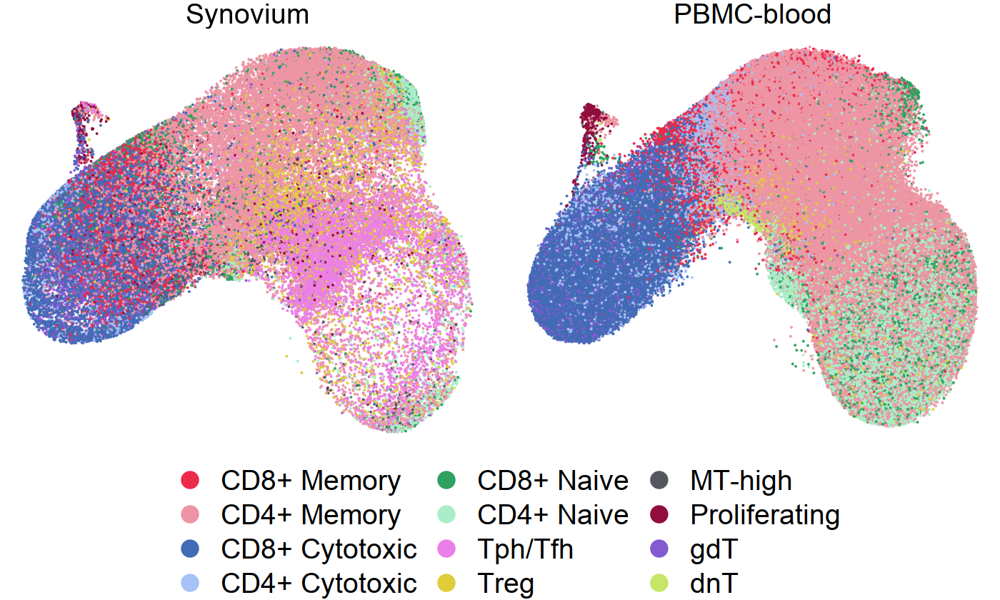

In [30]:
fig.size(4.2, 7)
pdf('../SuppFigs/Atlas_HLA_annot_T_UMAP_legend_bottom.pdf', height=4.2, width=7, useDingbats = FALSE)
data_subset$dataset = revalue(data_subset$dataset, old_new_dataset_names)
data_subset$dataset = factor(data_subset$dataset, levels = c('Synovium', 'Intestine', 'PBMC-cultured', 'PBMC-blood'))
p = data_subset %>%
            dplyr::sample_frac(1L) %>% # permute rows randomly
            ggplot(aes(x = UMAP1, y = UMAP2)) + 
            geom_point_rast(aes(col = dataset_cell_type_fine), size = 0.4, stroke = 0.2, shape = 16) + 
            theme_void() + 
            theme(plot.title = element_text(hjust = 0.5)) +
            theme(legend.position='bottom') +
            theme(legend.text = element_text(size=14), legend.title=element_text(size=14)) + 
            guides(colour = guide_legend(override.aes = list(size = 4), ncol = 3)) + labs(col = '') +
            scale_color_manual(values = T_colors) + facet_wrap(~dataset) +
            theme(strip.text.x = element_text(size = 14))
print(p)
dev.off()
p

## T: Map onto tissue states

In [31]:
ref_query = readRDS('../symphony/RefQuery_T_mapBloodOntoTissue.rds')

The following `from` values were not present in `x`: Smillie, Randolph_NI, Randolph



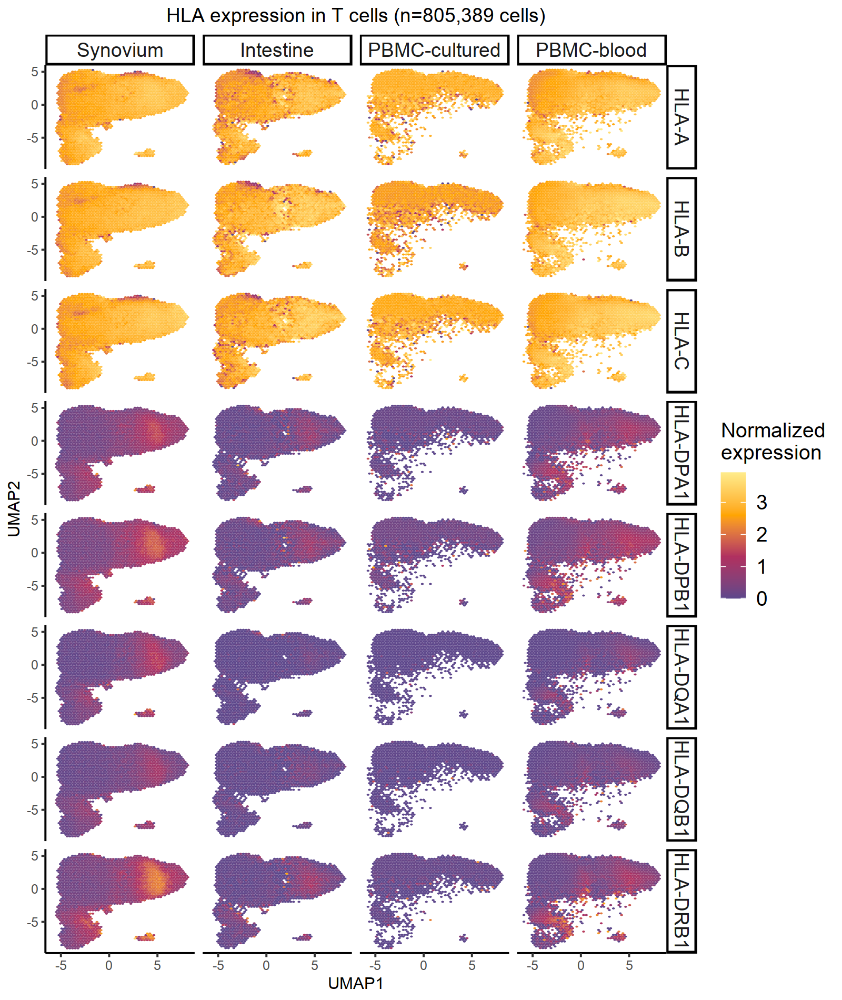

In [32]:
plot_eight_genes_hex(ref_query, '../SuppFigs/Atlas_HLA_expression_T_mapOntoTissue_UMAP_hex.pdf', cell_type = 'T')

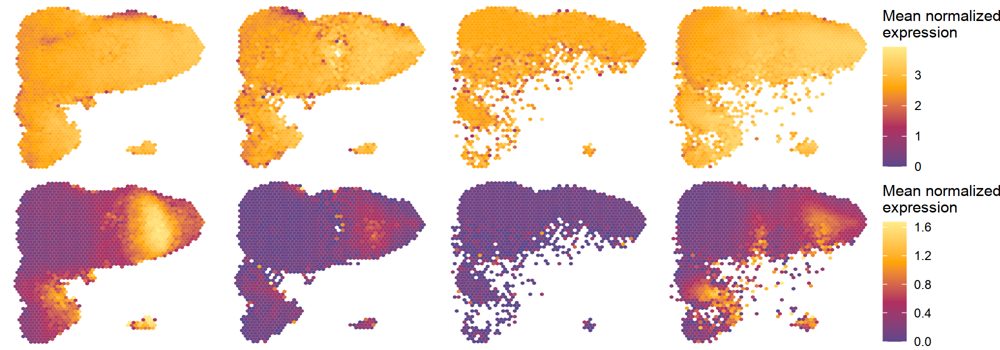

In [33]:
plot_byclass_hex(ref_query, 'Atlas_HLA_class_exp_T_mapOntoTissue_UMAP_hex.pdf')

In [34]:
data_subset = cbind(ref_query$meta_data, ref_query$umap$embedding) %>% filter(dataset %in% c('OneK1K', 'AMP2RA'))
data_subset$dataset_cell_type_fine %>% unique()

[1] "AMP2RA_T-6: CD4+ memory"             "AMP2RA_T-5: CD4+ GZMK+ memory"      
 [3] "AMP2RA_T-8: CD4+ CD25-high Treg"     "AMP2RA_T-22: Vdelta1"               
 [5] "AMP2RA_T-14: CD8+ GZMK+ memory"      "AMP2RA_T-2: CD4+ IL7R+CCR5+ memory" 
 [7] "AMP2RA_T-12: CD4+ GNLY+"             "AMP2RA_T-4: CD4+ naive"             
 [9] "AMP2RA_T-0: CD4+ IL7R+ memory"       "AMP2RA_T-3: CD4+ Tfh/Tph"           
[11] "AMP2RA_T-1: CD4+ CD161+ memory"      "AMP2RA_T-16: CD8+ CD45ROlow/naive"  
[13] "AMP2RA_T-18: Proliferating"          "AMP2RA_T-20: CD38+"                 
[15] "AMP2RA_T-13: CD8+ GZMK/B+ memory"    "AMP2RA_T-19: MT-high (low quality)" 
[17] "AMP2RA_T-10: CD4+ OX40+NR3C1+"       "AMP2RA_T-9: CD4+ CD25-low Treg"     
[19] "AMP2RA_T-15: CD8+ GZMB+/TEMRA"       "AMP2RA_T-11: CD4+ CD146+ memory"    
[21] "AMP2RA_T-7: CD4+ Tph"                "AMP2RA_T-23: Vdelta2"               
[23] "AMP2RA_T-17: CD8+ activated/NK-like" "OneK1K_CD4 TCM"                     
[25] "OneK1K_CD4 Naive"                    "OneK1K_CD8 TEM"                     
[27] "OneK1K_CD8 TCM"                      "OneK1K_CD4 TEM"                     
[29] "OneK1K_Treg"                         "OneK1K_gdT"                         
[31] "OneK1K_CD8 Naive"                    "OneK1K_dnT"                         
[33] "OneK1K_CD4 CTL"                      "OneK1K_CD4 Proliferating"           
[35] "OneK1K_CD8 Proliferating"

In [35]:
data_subset$dataset_cell_type_fine = revalue(data_subset$dataset_cell_type_fine, 
                                             old_new_T)

The following `from` values were not present in `x`: Smillie, Randolph_NI, Randolph



png 
  2

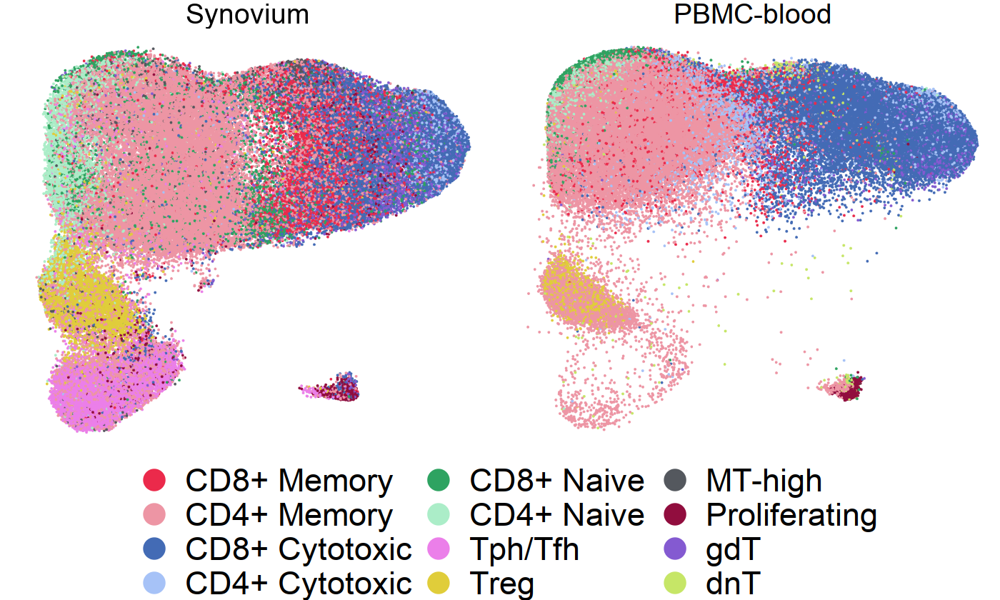

In [36]:
fig.size(4.2, 7)
pdf('Atlas_HLA_annot_T_mapOntoTissue_UMAP_legend_bottom.pdf', height=4.2, width=7, useDingbats = FALSE)
data_subset$dataset = revalue(data_subset$dataset, old_new_dataset_names)
data_subset$dataset = factor(data_subset$dataset, levels = c('Synovium', 'Intestine', 'PBMC-cultured', 'PBMC-blood'))
p = data_subset %>%
            dplyr::sample_frac(1L) %>% # permute rows randomly
            ggplot(aes(x = UMAP1, y = UMAP2)) + 
            geom_point_rast(aes(col = dataset_cell_type_fine), size = 0.4, stroke = 0.2, shape = 16) + 
            theme_void() + 
            theme(plot.title = element_text(hjust = 0.5)) +
            theme(legend.position='bottom') +
            theme(legend.text = element_text(size=16), legend.title=element_text(size=14)) + 
            guides(colour = guide_legend(override.aes = list(size = 5), ncol = 3)) + labs(col = '') +
            scale_color_manual(values = T_colors) + facet_wrap(~dataset) +
            theme(strip.text.x = element_text(size = 14))
print(p)
dev.off()
p

# Percent % variance explained

To estimate the percent of variance in HLA expression attributable to cell state, we used MuMIn (v.1.43.17).

For all cohorts except Randolph, ran the script at `../scripts/4_sceQTL/0_varexplained.R`

In [38]:
dataset_res = NULL
dataset = 'Randolph'
suppressWarnings({
for (c in c('B_plasma', 'Myeloid', 'T')) {
    message(c)
    sample_meta = read.csv(paste0('../data/meta/sample_meta_', dataset, '_completeHLA.csv'))
    meta_flu = readRDS(paste0('../eqtl_pseudobulk/0_data/cell_meta_', dataset, '_flu_', c ,'.rds'))
    meta_flu = left_join(meta_flu, sample_meta)
    exp_flu = readRDS(paste0('../eqtl_pseudobulk/0_data/exp_pers_', dataset, '_flu_', c,'.rds'))
    
    meta_NI = readRDS(paste0('../eqtl_pseudobulk/0_data/cell_meta_', dataset, '_NI_', c ,'.rds'))
    meta_NI = left_join(meta_NI, sample_meta)
    exp_NI = readRDS(paste0('../eqtl_pseudobulk/0_data/exp_pers_', dataset, '_NI_', c,'.rds'))
    meta = rbind(meta_flu, meta_NI)
    exp = cbind(exp_flu, exp_NI)
    
    # Get the hPCs
    refquery = readRDS(paste0('../symphony/RefQuery_', c,'_mapBloodOntoTissue.rds'))
    Z_symphony = refquery$Z_corr[, which(refquery$meta$dataset == paste0(dataset, '2021'))]
    
    ref = readRDS(paste0('../symphony/', dataset, '_', c, '_batch2_reference.rds'))
    colnames(ref$Z_orig) = ref$meta_data$Cell
    
    # reorder cells to match meta
    Z_symphony = Z_symphony[, meta$Cell]
    ref$Z_orig = ref$Z_orig[, meta$Cell]
    meta = cbind(meta, t(Z_symphony), t(ref$Z_orig))
    
    for (gene in c('A','B','C','DPA1','DPB1','DQA1','DQB1','DRB1')) {
        # Add gene counts
        name = paste0('HLA-', gene)
        meta = cbind(meta, exp[name, ])
        colnames(meta)[length(colnames(meta))] = paste0('HLA-', gene)
        full <- lme4::glmer.nb(formula = round(get(name)) ~ (1 | Sample) + (1 | Batch) + Age + Female + 
                    scale(log(nUMI)) + scale(percent.mito) + 
                    harmony_1 + harmony_2 + harmony_3 + harmony_4 + harmony_5 +
                    harmony_6 + harmony_7 + harmony_8 + harmony_9 + harmony_10 +
                    gPC1 + gPC2 + gPC3 + gPC4 + gPC5, nAGQ=0, 
                    data = meta, control = glmerControl(optimizer = "nloptwrap"))
        full_rsq = r.squaredGLMM(full)['delta', 'R2m']
        
        nostate <- lme4::glmer.nb(formula = round(get(name)) ~ (1 | Sample) + (1 | Batch) + Age + Female + 
                    scale(log(nUMI)) + scale(percent.mito) + 
                    gPC1 + gPC2 + gPC3 + gPC4 + gPC5, nAGQ=0, 
                    data = meta, control = glmerControl(optimizer = "nloptwrap"))
        nostate_rsq = r.squaredGLMM(nostate)['delta', 'R2m']
        
        cellstate_rsq = full_rsq - nostate_rsq
        out = data.frame(cell_type = c, gene = gene, full_rsq = full_rsq, nostate_rsq = nostate_rsq,
                        cellstate_rsq = cellstate_rsq)
        dataset_res = rbind(dataset_res, out)  
    }
    saveRDS(dataset_res, paste0(dataset, '_perc_var_explained.rds'))
}})

B_plasma

Joining, by = "Sample"
Joining, by = "Sample"
Myeloid

Joining, by = "Sample"
Joining, by = "Sample"
T

Joining, by = "Sample"
Joining, by = "Sample"


In [3]:
AMP2RA_res = readRDS('./AMP2RA_perc_var_explained.rds')
AMP2RA_res %>% mutate(class = ifelse(gene %in% c('A', 'B', 'C'), 'I', 'II')) %>%
    group_by(class) %>% dplyr::summarise(m = mean(cellstate_rsq),
                                         min = min(cellstate_rsq),
                                         max = max(cellstate_rsq),
                                         p25 = quantile(cellstate_rsq, probs = .25),
                                         p75 = quantile(cellstate_rsq, probs = .75))

class,m,min,max,p25,p75
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
I,0.1179339,0.02474284,0.2225640,0.07230549,0.1866057
II,0.4114277,0.19297045,0.7250495,0.26761275,0.6198528


In [4]:
OneK1K_res = readRDS('./OneK1K_perc_var_explained.rds')
OneK1K_res %>% mutate(class = ifelse(gene %in% c('A', 'B', 'C'), 'I', 'II')) %>%
    group_by(class) %>% dplyr::summarise(m = mean(cellstate_rsq),
                                         min = min(cellstate_rsq),
                                         max = max(cellstate_rsq),
                                         p25 = quantile(cellstate_rsq, probs = .25),
                                         p75 = quantile(cellstate_rsq, probs = .75))

class,m,min,max,p25,p75
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
I,0.08404289,-0.003292661,0.2233990,0.009226778,0.1648473
II,0.17276394,0.047685501,0.2485717,0.162842331,0.2015835


In [5]:
Smillie_res = readRDS('./Smillie_perc_var_explained.rds')
Smillie_res %>% mutate(class = ifelse(gene %in% c('A', 'B', 'C'), 'I', 'II')) %>%
    group_by(class) %>% dplyr::summarise(m = mean(cellstate_rsq),
                                         min = min(cellstate_rsq),
                                         max = max(cellstate_rsq),
                                         p25 = quantile(cellstate_rsq, probs = .25),
                                         p75 = quantile(cellstate_rsq, probs = .75))

class,m,min,max,p25,p75
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
I,0.2751774,0.09410069,0.4940552,0.1465454,0.4301288
II,0.3635752,0.03713546,0.7155905,0.1223130,0.7069924


In [6]:
Randolph_res = readRDS('./Randolph_perc_var_explained.rds')
Randolph_res %>% mutate(class = ifelse(gene %in% c('A', 'B', 'C'), 'I', 'II')) %>%
    group_by(class) %>% dplyr::summarise(m = mean(cellstate_rsq),
                                         min = min(cellstate_rsq),
                                         max = max(cellstate_rsq),
                                         p25 = quantile(cellstate_rsq, probs = .25),
                                         p75 = quantile(cellstate_rsq, probs = .75))

class,m,min,max,p25,p75
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
I,0.2869822,0.098953586,0.4091854,0.12276369,0.3809086
II,0.2419189,0.006763715,0.5018532,0.05636854,0.3567506


In [7]:
AMP2RA_res$dataset = 'Synovium'
Smillie_res$dataset = 'Intestine'
Randolph_res$dataset = 'PBMC-cultured'
OneK1K_res$dataset = 'PBMC-blood'

combined_res = rbind(AMP2RA_res, Smillie_res, Randolph_res, OneK1K_res)
combined_res = combined_res %>% mutate(gene = paste0('HLA-', gene),
                                       cell_type = ifelse(cell_type == 'B_plasma', 'B', cell_type),
                                       class = ifelse(gene %in% c('HLA-A', 'HLA-B', 'HLA-C'), 'I', 'II'))
combined_res$dataset = factor(combined_res$dataset, levels = c('Synovium', 'Intestine', 'PBMC-cultured', 'PBMC-blood'))
combined_res %>% filter(cell_type == 'Myeloid', dataset == 'Intestine')

cell_type,gene,full_rsq,nostate_rsq,cellstate_rsq,dataset,class
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
Myeloid,HLA-A,0.4716694,0.04154055,0.4301288,Intestine,I
Myeloid,HLA-B,0.5117199,0.03709364,0.4746263,Intestine,I
Myeloid,HLA-C,0.5151087,0.02105357,0.4940552,Intestine,I
Myeloid,HLA-DPA1,0.7524913,0.03690075,0.7155905,Intestine,II
Myeloid,HLA-DPB1,0.7429545,0.03358793,0.7093666,Intestine,II
Myeloid,HLA-DQA1,0.7468171,0.03679915,0.7100180,Intestine,II
Myeloid,HLA-DQB1,0.7302547,0.02563655,0.7046182,Intestine,II
Myeloid,HLA-DRB1,0.7605947,0.05015570,0.7104390,Intestine,II


In [8]:
combined_res %>% group_by(class) %>% dplyr::summarise(m = mean(cellstate_rsq),
                                         min = min(cellstate_rsq),
                                         max = max(cellstate_rsq),
                                         p25 = quantile(cellstate_rsq, probs = .25),
                                         p75 = quantile(cellstate_rsq, probs = .75))

class,m,min,max,p25,p75
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
I,0.1910341,-0.003292661,0.4940552,0.07508424,0.3381036
II,0.2974214,0.006763715,0.7250495,0.16556435,0.3704851


In [9]:
write.csv(combined_res, '../SuppTables/Table_percent_variance_explained_cellstate.csv', row.names = F, quote = F)

In [10]:
combined_res$cell_type = factor(combined_res$cell_type, levels = rev(c('Myeloid', 'B', 'T')))

png 
  2

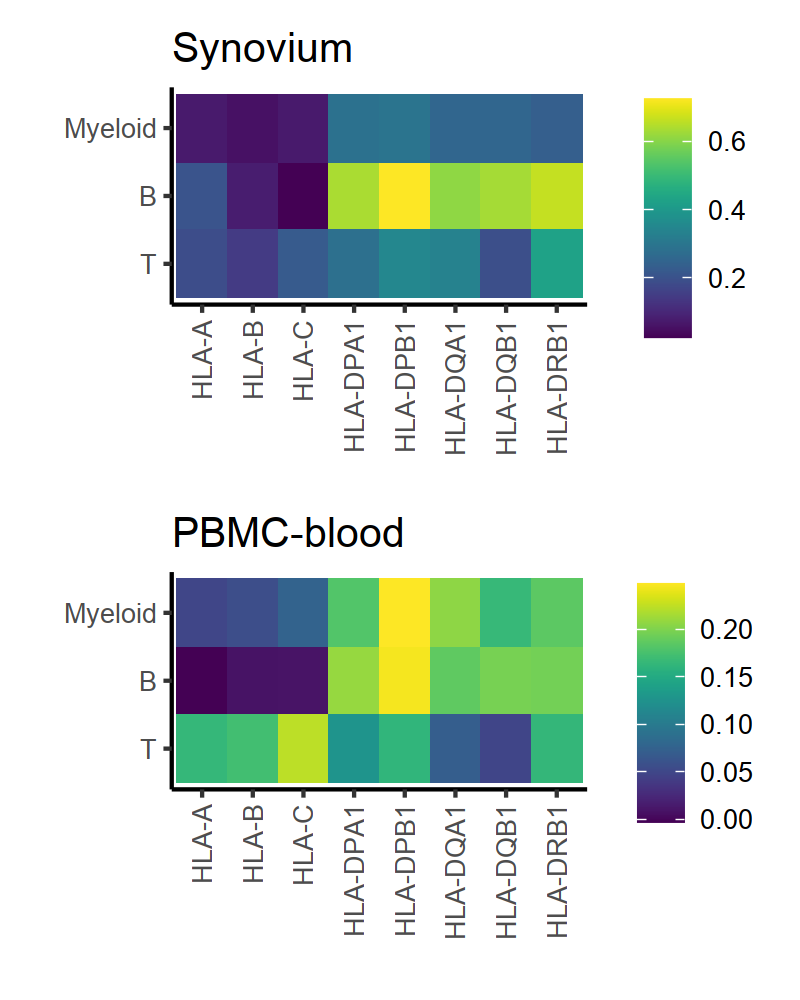

In [11]:
pdf('percent_variance_heatmap_SynBlood.pdf', width = 4, height = 5)
p1 = combined_res %>% filter(dataset %in% c('Synovium')) %>%
    ggplot() +
        geom_tile(aes(x = gene, y = cell_type, fill = cellstate_rsq)) + 
        theme_classic(base_size = 12) + ggtitle('Synovium') +
        scale_fill_viridis(option = 'viridis') + xlab('') + ylab('') + 
        theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1)) +
        labs(fill = '')
p2 = combined_res %>% filter(dataset %in% c('PBMC-blood')) %>%
    ggplot() +
        geom_tile(aes(x = gene, y = cell_type, fill = cellstate_rsq)) + 
        theme_classic(base_size = 12) + ggtitle('PBMC-blood') +
        scale_fill_viridis(option = 'viridis') + xlab('') + ylab('') + 
        theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1)) +
        labs(fill = '')

fig.size(5, 4)
print(p1 / p2)
dev.off()
p1 / p2

# Link clusters to hPCs

In [2]:
# This was copied from Stackflow: https://stackoverflow.com/questions/43051525/how-to-draw-pheatmap-plot-to-screen-and-also-save-to-file
save_pheatmap_pdf <- function(x, filename, width=7, height=7) {
    stopifnot(!missing(x))
    stopifnot(!missing(filename))
    pdf(filename, width=width, height=height)
    grid::grid.newpage()
    grid::grid.draw(x$gtable)
    dev.off()
}

In [3]:
colors <- c(colorRampPalette(c("blue", "lightyellow", "red"))(100), "red")

## Myeloid cells

In [27]:
# Read in object
obj = readRDS('../symphony/RefQuery_Myeloid_mapBloodOntoTissue.rds')
obj$meta_data$dataset_cell_type_fine = revalue(obj$meta_data$dataset_cell_type_fine, old_new_Myeloid)

# Extract the AMP2RA cells
idx_AMP2RA = which(obj$meta_data$dataset == 'AMP2RA')
Z_AMP2RA = obj$Z_corr[, idx_AMP2RA] %>% t()
data_AMP2RA = cbind(obj$meta_data[idx_AMP2RA, ], Z_AMP2RA)

# Extract the OneK1K cells
idx_OneK1K = which(obj$meta_data$dataset == 'OneK1K')
Z_OneK1K = obj$Z_corr[, idx_OneK1K] %>% t()
data_OneK1K = cbind(obj$meta_data[idx_OneK1K, ], Z_OneK1K)

res_AMP2RA = data_AMP2RA %>% group_by(dataset_cell_type_fine) %>% 
    dplyr::summarise(across(harmony_1:harmony_10, list(mean = mean)))#, q2.5 = ~quantile(., 0.025),
                                                                         #q97.5 = ~quantile(., 0.975))))
res_long_AMP2RA = gather(res_AMP2RA, hPC, mean, harmony_1_mean:harmony_10_mean, factor_key=TRUE)

res_OneK1K = data_OneK1K %>% group_by(dataset_cell_type_fine) %>% 
    dplyr::summarise(across(harmony_1:harmony_10, list(mean = mean)))
res_long_OneK1K = gather(res_OneK1K, hPC, mean, harmony_1_mean:harmony_10_mean, factor_key=TRUE)

png 
  2

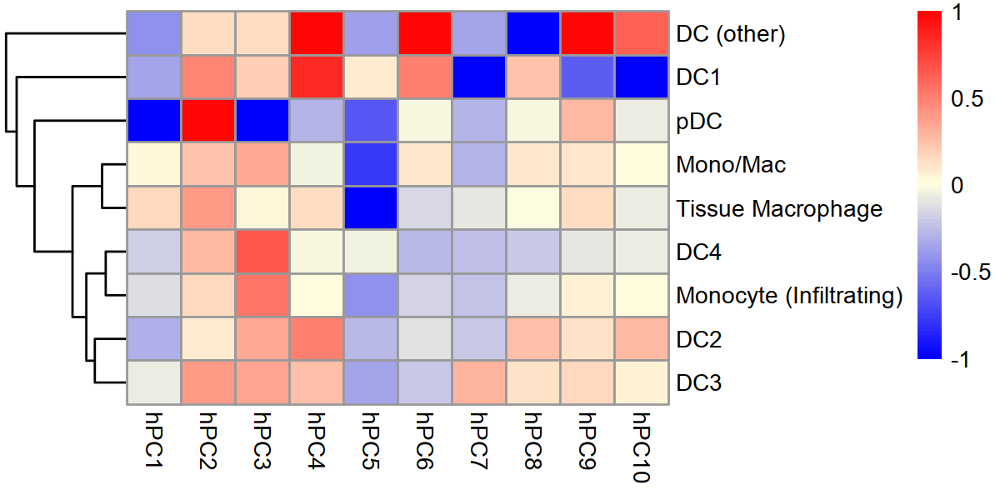

In [29]:
pm_AMP2RA = res_AMP2RA %>% dplyr::select(harmony_1_mean:harmony_10_mean) %>% as.data.frame()
rownames(pm_AMP2RA) = res_AMP2RA$dataset_cell_type_fine
colnames(pm_AMP2RA) = paste0('hPC', 1:10)
pm_AMP2RA$dataset_cell_type_fine = NULL

pm_AMP2RA = apply(pm_AMP2RA, 2, function(col) col / abs(max(abs(col)))) # scale to column's max value

breaks <- c(seq(min(pm_AMP2RA), max(pm_AMP2RA), length.out = 100), Inf)  

fig.size(3, 6)
p = pheatmap(pm_AMP2RA, cluster_cols = FALSE, cluster_rows = TRUE, breaks = breaks, color = colors)
save_pheatmap_pdf(p, '../SuppFigs/hPCs_means_AMP2RA_Myeloid.pdf', width=6, height=3)

png 
  2

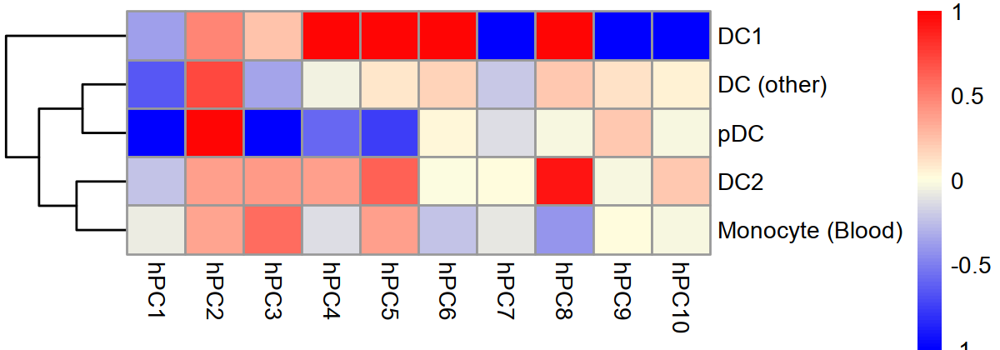

In [30]:
pm_OneK1K = res_OneK1K %>% 
    dplyr::select(harmony_1_mean:harmony_10_mean) %>% as.data.frame()
rownames(pm_OneK1K) = res_OneK1K$dataset_cell_type_fine
colnames(pm_OneK1K) = paste0('hPC', 1:10)
pm_OneK1K$dataset_cell_type_fine = NULL

pm_OneK1K = apply(pm_OneK1K, 2, function(col) col / abs(max(abs(col)))) # scale to column's max value

breaks <- c(seq(min(pm_OneK1K), max(pm_OneK1K), length.out = 100), Inf)

fig.size(2.1, 6)
p = pheatmap(pm_OneK1K, cluster_cols = FALSE, cluster_rows = TRUE, breaks = breaks, color = colors)
save_pheatmap_pdf(p, '../SuppFigs/hPCs_means_OneK1K_Myeloid.pdf', width=6, height=2.1)

## B cells

In [31]:
# Read in object
obj = readRDS('../symphony/RefQuery_B_plasma_mapBloodOntoTissue.rds')
obj$meta_data$dataset_cell_type_fine = revalue(obj$meta_data$dataset_cell_type_fine, old_new_B_plasma)

# Extract the AMP2RA cells
idx_AMP2RA = which(obj$meta_data$dataset == 'AMP2RA')
Z_AMP2RA = obj$Z_corr[, idx_AMP2RA] %>% t() 
data_AMP2RA = cbind(obj$meta_data[idx_AMP2RA, ], Z_AMP2RA)

# Extract the OneK1K cells
idx_OneK1K = which(obj$meta_data$dataset == 'OneK1K')
Z_OneK1K = obj$Z_corr[, idx_OneK1K] %>% t() 
data_OneK1K = cbind(obj$meta_data[idx_OneK1K, ], Z_OneK1K)

res_AMP2RA = data_AMP2RA %>% group_by(dataset_cell_type_fine) %>% 
    dplyr::summarise(across(harmony_1:harmony_10, list(mean = mean)))
res_long_AMP2RA = gather(res_AMP2RA, hPC, mean, harmony_1_mean:harmony_10_mean, factor_key=TRUE)

res_OneK1K = data_OneK1K %>% group_by(dataset_cell_type_fine) %>% 
    dplyr::summarise(across(harmony_1:harmony_10, list(mean = mean)))
res_long_OneK1K = gather(res_OneK1K, hPC, mean, harmony_1_mean:harmony_10_mean, factor_key=TRUE)

png 
  2

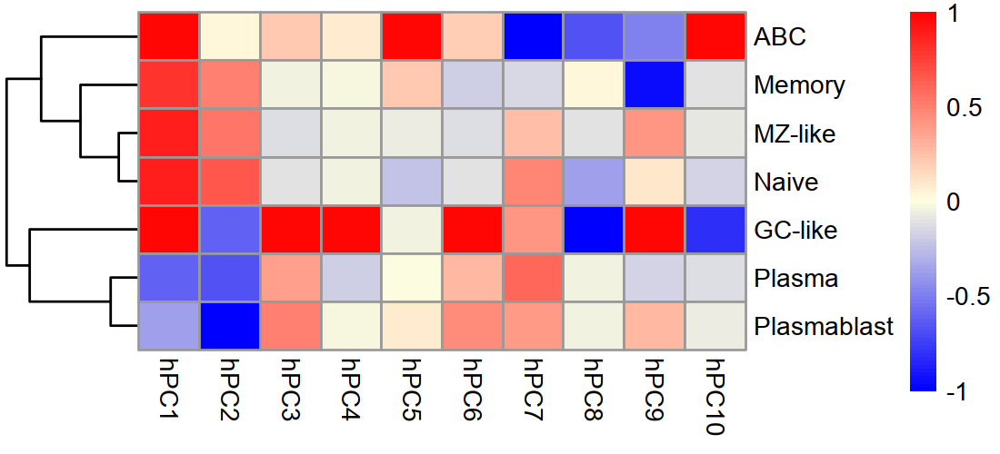

In [32]:
pm_AMP2RA = res_AMP2RA %>% dplyr::select(harmony_1_mean:harmony_10_mean) %>% as.data.frame()
rownames(pm_AMP2RA) = res_AMP2RA$dataset_cell_type_fine
colnames(pm_AMP2RA) = paste0('hPC', 1:10)
pm_AMP2RA$dataset_cell_type_fine = NULL

pm_AMP2RA = apply(pm_AMP2RA, 2, function(col) col / abs(max(abs(col)))) # scale to column's max value
                  
breaks <- c(seq(min(pm_AMP2RA), max(pm_AMP2RA), length.out = 100), Inf)

fig.size(2.5, 5.5)
p = pheatmap(pm_AMP2RA, cluster_cols = FALSE, cluster_rows = TRUE, breaks = breaks, color = colors)
save_pheatmap_pdf(p, '../SuppFigs/hPCs_means_AMP2RA_B.pdf', width=5.5, height=2.5)

png 
  2

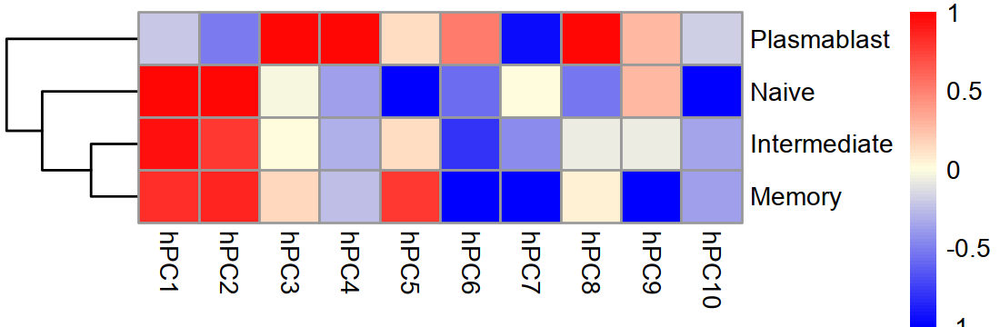

In [33]:
pm_OneK1K = res_OneK1K %>% 
    dplyr::select(harmony_1_mean:harmony_10_mean) %>% as.data.frame()
rownames(pm_OneK1K) = res_OneK1K$dataset_cell_type_fine
colnames(pm_OneK1K) = paste0('hPC', 1:10)
pm_OneK1K$dataset_cell_type_fine = NULL

pm_OneK1K = apply(pm_OneK1K, 2, function(col) col / abs(max(abs(col)))) # scale to column's max value

breaks <- c(seq(min(pm_OneK1K), max(pm_OneK1K), length.out = 100), Inf)

fig.size(1.8, 5.5)
p = pheatmap(pm_OneK1K, cluster_cols = FALSE, cluster_rows = TRUE, breaks = breaks, color = colors)
save_pheatmap_pdf(p, '../SuppFigs/hPCs_means_OneK1K_B.pdf', width=5.5, height=1.8)

## T cells

In [40]:
# Read in object
obj = readRDS('../symphony/RefQuery_T_mapBloodOntoTissue.rds')
obj$meta_data$dataset_cell_type_fine = revalue(obj$meta_data$dataset_cell_type_fine, old_new_T)

# Extract the AMP2RA cells
idx_AMP2RA = which(obj$meta_data$dataset == 'AMP2RA')
Z_AMP2RA = obj$Z_corr[, idx_AMP2RA] %>% t()
data_AMP2RA = cbind(obj$meta_data[idx_AMP2RA, ], Z_AMP2RA)

# Extract the OneK1K cells
idx_OneK1K = which(obj$meta_data$dataset == 'OneK1K')
Z_OneK1K = obj$Z_corr[, idx_OneK1K] %>% t()
data_OneK1K = cbind(obj$meta_data[idx_OneK1K, ], Z_OneK1K)

res_AMP2RA = data_AMP2RA %>% group_by(dataset_cell_type_fine) %>% 
    dplyr::summarise(across(harmony_1:harmony_10, list(mean = mean)))
res_long_AMP2RA = gather(res_AMP2RA, hPC, mean, harmony_1_mean:harmony_10_mean, factor_key=TRUE)

res_OneK1K = data_OneK1K %>% group_by(dataset_cell_type_fine) %>% 
    dplyr::summarise(across(harmony_1:harmony_10, list(mean = mean)))
res_long_OneK1K = gather(res_OneK1K, hPC, mean, harmony_1_mean:harmony_10_mean, factor_key=TRUE)

png 
  2

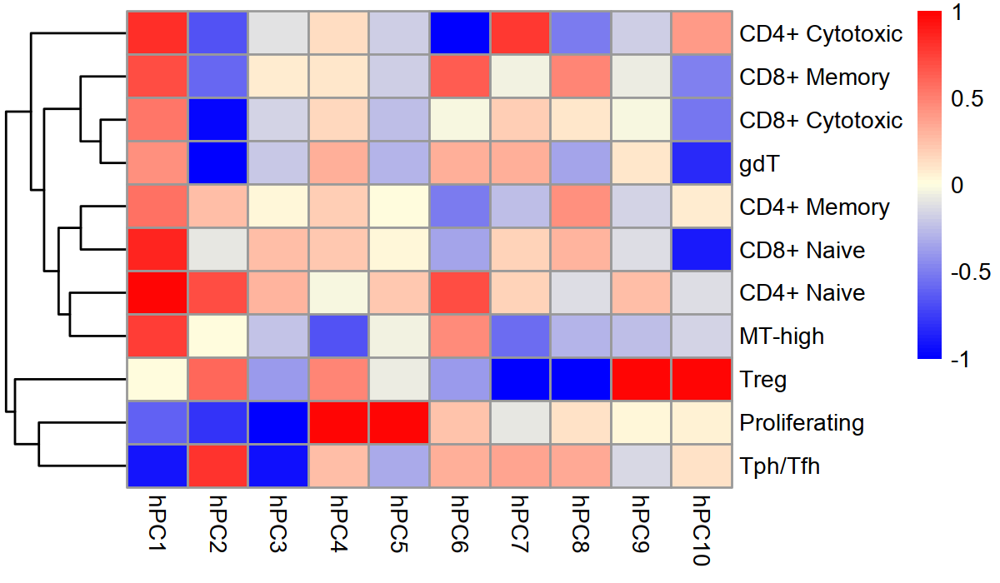

In [41]:
pm_AMP2RA = res_AMP2RA %>% dplyr::select(harmony_1_mean:harmony_10_mean) %>% as.data.frame()
rownames(pm_AMP2RA) = res_AMP2RA$dataset_cell_type_fine
colnames(pm_AMP2RA) = paste0('hPC', 1:10)
pm_AMP2RA$dataset_cell_type_fine = NULL

pm_AMP2RA = apply(pm_AMP2RA, 2, function(col) col / abs(max(abs(col)))) # scale to column's max value

breaks <- c(seq(min(pm_AMP2RA), max(pm_AMP2RA), length.out = 100), Inf)  

fig.size(3.5, 6)
p = pheatmap(pm_AMP2RA, cluster_cols = FALSE, cluster_rows = TRUE, breaks = breaks, color = colors)
save_pheatmap_pdf(p, '../SuppFigs/hPCs_means_AMP2RA_T.pdf', width=6, height=3.5)

png 
  2

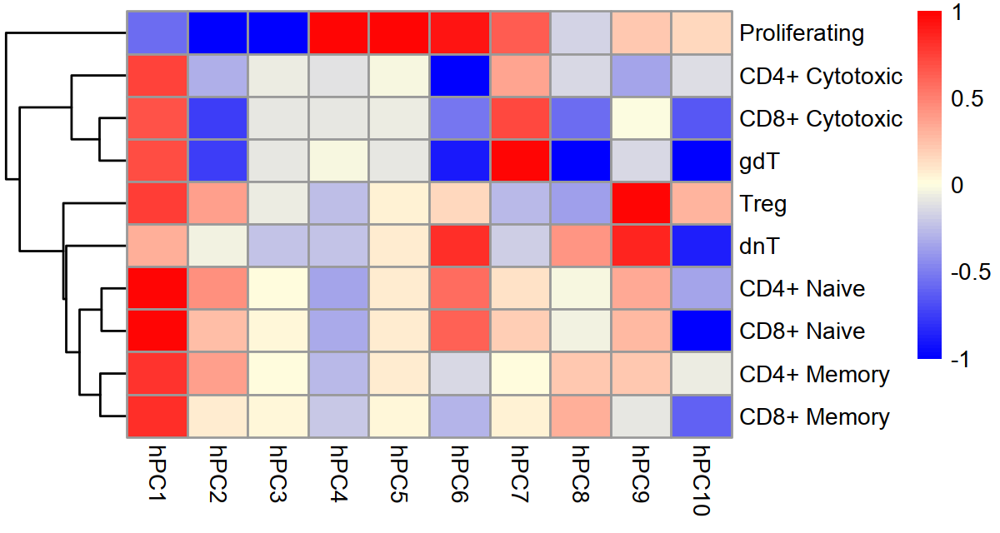

In [43]:
pm_OneK1K = res_OneK1K %>% 
    dplyr::select(harmony_1_mean:harmony_10_mean) %>% as.data.frame()
rownames(pm_OneK1K) = res_OneK1K$dataset_cell_type_fine
colnames(pm_OneK1K) = paste0('hPC', 1:10)
pm_OneK1K$dataset_cell_type_fine = NULL

pm_OneK1K = apply(pm_OneK1K, 2, function(col) col / abs(max(abs(col)))) # scale to column's max value

breaks <- c(seq(min(pm_OneK1K), max(pm_OneK1K), length.out = 100), Inf)

fig.size(3.2, 6)
p = pheatmap(pm_OneK1K, cluster_cols = FALSE, cluster_rows = TRUE, breaks = breaks, color = colors)
save_pheatmap_pdf(p, '../SuppFigs/hPCs_means_OneK1K_T.pdf', width=6, height=3.2)

# All done!

In [14]:
sessionInfo()

R version 4.0.5 (2021-03-31)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: Red Hat Enterprise Linux Server release 6.5 (Santiago)

Matrix products: default
BLAS/LAPACK: /PHShome/jbk37/anaconda3/envs/hla_new/lib/libopenblasp-r0.3.18.so

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
 [1] patchwork_1.1.1         MuMIn_1.43.17           ggrepel_0.9.1          
 [4] lme4_1.1-28             ggpubr_0.4.0            cowplot_1.1.1          
 [7] purrr_0.3.4             RColorBrewer_1.1-3      ggrastr_1.0.1          
[10] viridis_0.6.2           viridi